##Data Preprocessing, cleaning and Augmentation


1. Load and Inspect the Data
- Verify all file names and labels exist
- Check for missing or invalid values
- Ensure all image formats are consistent


2. Clean and Standardize the Data
- Convert all images to 3-channel RGB
- Resize images to 224 × 224 (required for ResNet input)
- Apply label encoding (e.g., convert class names to indices)
- Perform a Train/Val/Test split (70% / 15% / 15%) — ensure the split is random and stratified
- Shorten the label encodings

3. Data Augmentation (Training Set Only):
- Random Horizontal Flip
- Random Rotation
- Noise Invariance


4. Normalize the Inputs (https://docs.pytorch.org/vision/stable/models.html) <-- PyTorch Documentation: mean=[0.485, 0.456, 0.406] and std=[0.229, 0.224, 0.225]

In [ ]:
# Import Required Libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
import torch
from torch.utils.data import Dataset, DataLoader
import torchvision.transforms as transforms
import torchvision

# Check if CUDA is available
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f'Using device: {DEVICE}')

Using device: cuda


In [ ]:
#Fetch the json files
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
#Set up the Kaggle API and download the dataset

!mkdir -p ~/.kaggle
!cp "/content/drive/MyDrive/APS360 Final Project/Data/kaggle.json" ~/.kaggle/


!chmod 600 ~/.kaggle/kaggle.json


!kaggle datasets download -d kmader/skin-cancer-mnist-ham10000


!unzip -q skin-cancer-mnist-ham10000.zip -d skin_cancer_data


!ls skin_cancer_data

Dataset URL: https://www.kaggle.com/datasets/kmader/skin-cancer-mnist-ham10000
License(s): CC-BY-NC-SA-4.0
100% 5.18G/5.20G [01:25<00:00, 159MB/s]
100% 5.20G/5.20G [01:25<00:00, 65.1MB/s]
ham10000_images_part_1	HAM10000_images_part_2	hmnist_28_28_RGB.csv
HAM10000_images_part_1	HAM10000_metadata.csv	hmnist_8_8_L.csv
ham10000_images_part_2	hmnist_28_28_L.csv	hmnist_8_8_RGB.csv


In [ ]:
# Load the data CSV
data_path = "skin_cancer_data/HAM10000_metadata.csv"
df = pd.read_csv(data_path)

# View the first few rows
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [ ]:
#check for any null values
df.isnull().sum()

# Check unique diagnosis labels
print("Diagnosis classes:", df['dx'].unique())
print("Class distribution:\n", df['dx'].value_counts())

Diagnosis classes: ['bkl' 'nv' 'df' 'mel' 'vasc' 'bcc' 'akiec']
Class distribution:
 dx
nv       6705
mel      1113
bkl      1099
bcc       514
akiec     327
vasc      142
df        115
Name: count, dtype: int64


In [ ]:
import os

image_dir_1 = "skin_cancer_data/ham10000_images_part_1"
image_dir_2 = "skin_cancer_data/ham10000_images_part_2"

#merge both image directories
all_image_paths = {
    os.path.splitext(fname)[0]: os.path.join(image_dir_1, fname)
    for fname in os.listdir(image_dir_1)
}
all_image_paths.update({
    os.path.splitext(fname)[0]: os.path.join(image_dir_2, fname)
    for fname in os.listdir(image_dir_2)
})

#map the images
df['image_path'] = df['image_id'].map(all_image_paths)

#ensure there are no missing paths
missing_paths = df[df['image_path'].isnull()]
print("Missing image files:", len(missing_paths))


Missing image files: 0


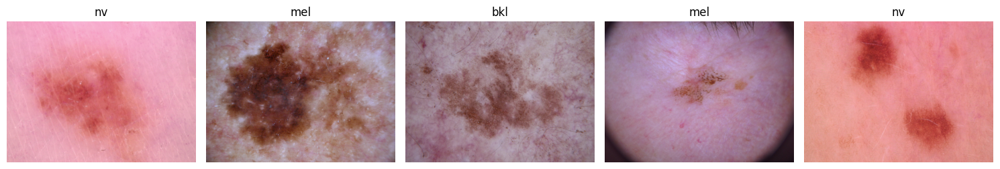

In [ ]:

import matplotlib.image as mpimg

#show 5 random samples
sample_df = df.sample(5)

fig, axes = plt.subplots(1, 5, figsize=(15, 5))
for ax, (_, row) in zip(axes, sample_df.iterrows()):
    img = mpimg.imread(row['image_path'])
    ax.imshow(img)
    ax.set_title(row['dx'])
    ax.axis('off')
plt.tight_layout()
plt.show()


In [ ]:
# Label Encoding

from sklearn.preprocessing import LabelEncoder


label_encoder = LabelEncoder()
df['label'] = label_encoder.fit_transform(df['dx'])
print("Label classes:", label_encoder.classes_)
label_map = dict(zip(label_encoder.transform(label_encoder.classes_),
                     label_encoder.classes_))
print("Label map:", label_map)


Label classes: ['akiec' 'bcc' 'bkl' 'df' 'mel' 'nv' 'vasc']
Label map: {np.int64(0): 'akiec', np.int64(1): 'bcc', np.int64(2): 'bkl', np.int64(3): 'df', np.int64(4): 'mel', np.int64(5): 'nv', np.int64(6): 'vasc'}


In [ ]:
#Train-Val-Test Split

from sklearn.model_selection import train_test_split

#70% for training and 30% between test and val
train_df, temp_df = train_test_split(df,
                                     test_size=0.30,
                                     stratify=df['label'],
                                     random_state=42)

#here we split the val and test
val_df, test_df = train_test_split(temp_df,
                                   test_size=0.50,
                                   stratify=temp_df['label'],
                                   random_state=42)

# Sanity check
print(f"Train: {len(train_df)} | Val: {len(val_df)} | Test: {len(test_df)}")


Train: 7010 | Val: 1502 | Test: 1503


In [ ]:
#ensure that the images are 224x224 (ResNet requirements)

#normalize the images as well

import torchvision.transforms as transforms

# image transformations to match ResNet18 requirements
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

In [ ]:
#we will apply data augmentation on our training dataset by introducing
#rotation and noise invariance

train_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=20),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

#no augmentation for the validation set

val_test_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])



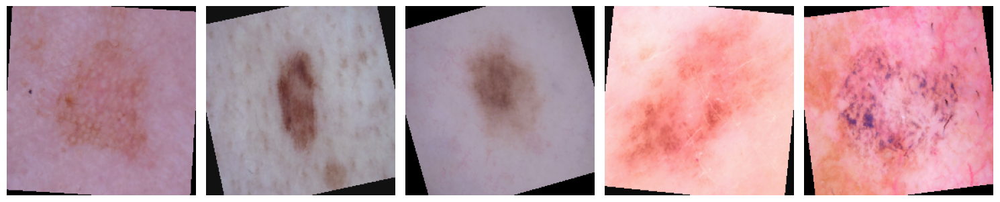

In [ ]:
#view some of the invariances

import random
import matplotlib.pyplot as plt
from PIL import Image

#5 random images
sample_paths = random.sample(list(train_df['image_path']), 5)

plt.figure(figsize=(15,5))

for i, img_path in enumerate(sample_paths):

    img = Image.open(img_path).convert('RGB')


    img_transformed = train_transform(img)


    mean = torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3,1,1)
    img_display = img_transformed * std + mean
    img_display = img_display.permute(1, 2, 0).numpy()

    plt.subplot(1, 5, i+1)
    plt.imshow(img_display)
    plt.axis('off')

plt.tight_layout()
plt.show()


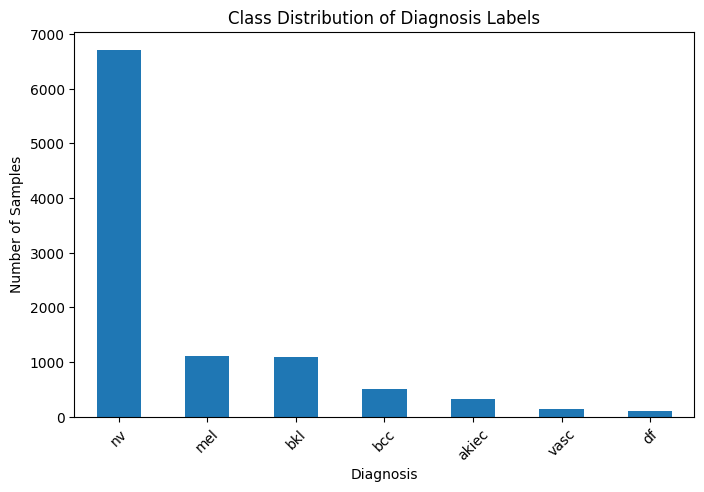

In [ ]:
#Visualizing the data

plt.figure(figsize=(8,5))
df['dx'].value_counts().plot(kind='bar')
plt.title('Class Distribution of Diagnosis Labels')
plt.xlabel('Diagnosis')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.show()


We can see that there is a class imbalance. To address this we will use oversampling of the minority classes via data augmentation

In [ ]:
train_dir = "/content/drive/MyDrive/APS360 Final Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Final Project/Data/val"
test_dir = "/content/drive/MyDrive/APS360 Final Project/Data/test"

In [ ]:
import shutil

from tqdm import tqdm

train_dir = "/content/drive/MyDrive/APS360 Final Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Final Project/Data/val"
test_dir = "/content/drive/MyDrive/APS360 Final Project/Data/test"

idx_class = dict(enumerate(label_encoder.classes_))

def create_class_folders(df, base_dir):
    for idx, row in tqdm(df.iterrows(), total=len(df)):
        img_path = row['image_path']
        dx = row['dx']
        label = row['label']
        class_folder = os.path.join(base_dir, idx_class[label])
        if not os.path.exists(class_folder):
            os.makedirs(class_folder)
            shutil.copy(img_path, class_folder)
        else:
            shutil.copy(img_path, class_folder)
            print(f"Image {img_path} copied to class folder {class_folder}")


create_class_folders(train_df, train_dir)
create_class_folders(val_df, val_dir)
create_class_folders(test_df, test_dir)

augmented_transforms = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(degrees=180),
    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2
    ),
    transforms.ToTensor(),
])

def augment_images(class_dir, target_num=6000):
    existing_images = os.listdir(class_dir)
    current_count = len(existing_images)

    if current_count >= target_num:
        print(
f"{os.path.basename(class_dir)} already has {current_count} images, skipping augmentation.")
        return

    print(
f"Augmenting {os.path.basename(class_dir)} from {current_count} to {target_num} images.")

    image_paths = [os.path.join(class_dir, fname) for fname in existing_images]

    for i in tqdm(range(target_num - current_count)):
        img_path = random.choice(image_paths)
        img = Image.open(img_path).convert('RGB')
        img_t = augmented_transforms(img)

        save_path = os.path.join(class_dir,
                                 f"augmented_{i}_{os.path.basename(img_path)}")


        torchvision.utils.save_image(img_t, save_path)

for label in train_df['label'].unique():
    class_folder = os.path.join(train_dir, idx_class[label])
    augment_images(class_folder, target_num=6000)


  0%|          | 0/7010 [00:00<?, ?it/s]

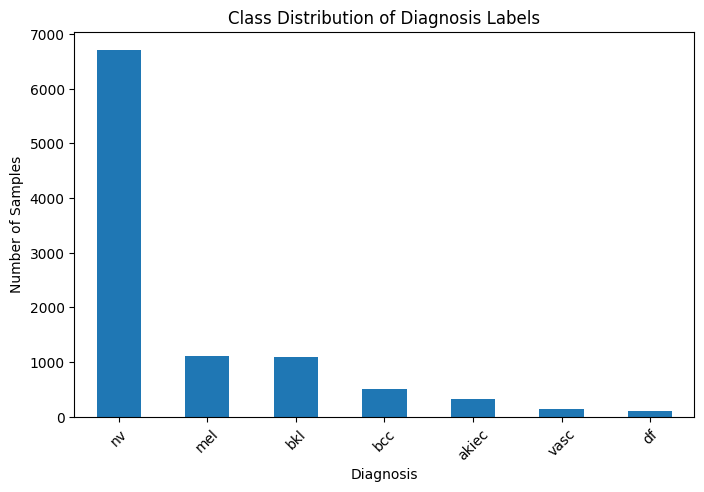

In [ ]:
#Visualizing the data

plt.figure(figsize=(8,5))
df['dx'].value_counts().plot(kind='bar')
plt.title('Class Distribution of Diagnosis Labels')
plt.xlabel('Diagnosis')
plt.ylabel('Number of Samples')
plt.xticks(rotation=45)
plt.show()


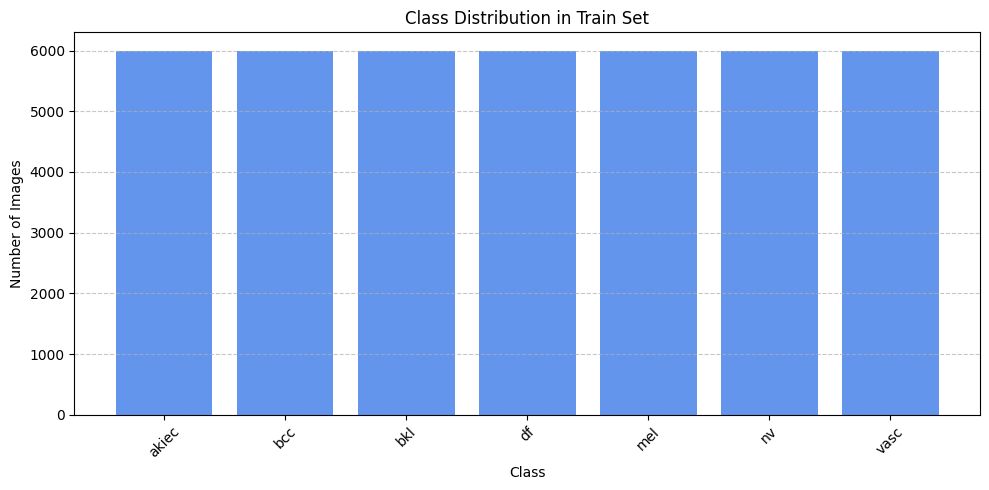

In [ ]:

folder_path = train_dir


class_counts = {}
for class_name in sorted(os.listdir(folder_path)):
    class_path = os.path.join(folder_path, class_name)
    if os.path.isdir(class_path):
        num_images = len(os.listdir(class_path))
        class_counts[class_name] = num_images


plt.figure(figsize=(10, 5))
plt.bar(class_counts.keys(), class_counts.values(), color='cornflowerblue')
plt.title("Class Distribution in Train Set")
plt.xlabel("Class")
plt.ylabel("Number of Images")
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

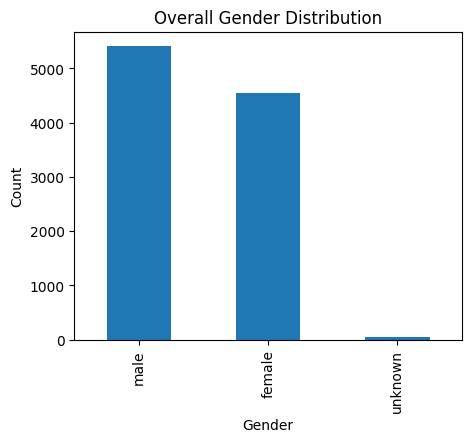

In [ ]:
#gender distribution

plt.figure(figsize=(5,4))
df['sex'].value_counts().plot(kind='bar')
plt.title('Overall Gender Distribution')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.show()


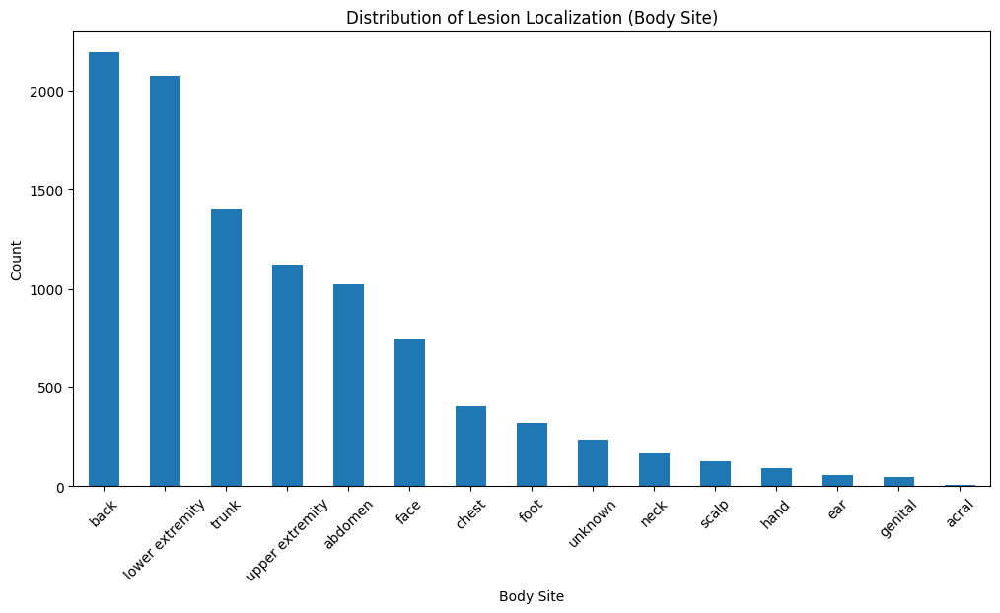

In [ ]:
#localization distribution
plt.figure(figsize=(12,6))
df['localization'].value_counts().plot(kind='bar')
plt.title('Distribution of Lesion Localization (Body Site)')
plt.xlabel('Body Site')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()


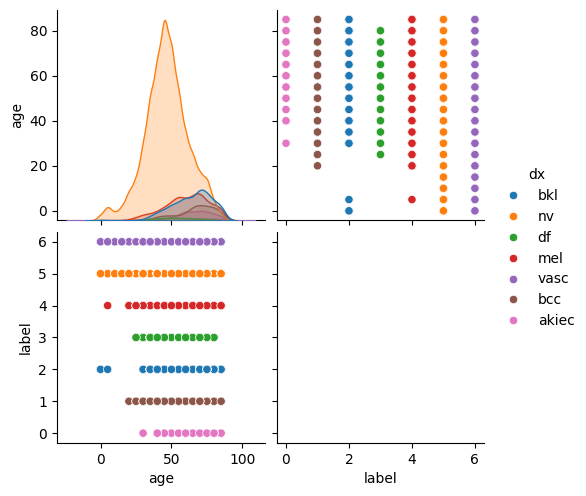

In [ ]:
import seaborn as sns
sns.pairplot(df, vars=['age', 'label'], hue='dx')
plt.show()


## Baseline Model

Training Functions

In [ ]:
def get_accuracy(model, data_loader, device):
    model.eval()
    correct = 0
    total = 0

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs, labels = imgs.to(device), labels.to(device)

            outputs = model(imgs)
            preds = outputs.argmax(dim=1)
            correct += (preds == labels).sum().item()
            total += labels.size(0)

    return correct / total

In [ ]:
def train(model, train_loader, val_loader, device, batch_size=64,
          num_epochs=25, patience=3):
    criterion = nn.CrossEntropyLoss()
    optimizer = torch.optim.Adam(model.parameters(), lr=0.001)

    iters, losses, train_accs, val_accs = [], [], [], []
    n = 0

    best_val_acc = 0
    patience_counter = 0
    best_model_state = None

    model.to(device)

    for epoch in range(num_epochs):
        model.train()
        epoch_loss = 0
        epoch_acc = 0
        total_samples = 0

        for imgs, labels in train_loader:
            imgs, labels = imgs.to(device), labels.to(device)

            optimizer.zero_grad()
            outputs = model(imgs)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()

            preds = outputs.argmax(dim=1)
            acc = (preds == labels).float().sum().item()
            batch_size_actual = labels.size(0)

            epoch_loss += loss.item() * batch_size_actual
            epoch_acc += acc
            total_samples += batch_size_actual

            iters.append(n)
            losses.append(loss.item())
            n += 1

        avg_loss = epoch_loss / total_samples
        avg_train_acc = epoch_acc / total_samples
        avg_val_acc = get_accuracy(model, val_loader, device)

        train_accs.append(avg_train_acc)
        val_accs.append(avg_val_acc)

        print(
f"Epoch {epoch+1}/{num_epochs} | Loss: {avg_loss:.4f} | Train Acc: {avg_train_acc:.4f} | Val Acc: {avg_val_acc:.4f}")

        #early stopping
        if avg_val_acc > best_val_acc:
            best_val_acc = avg_val_acc
            best_model_state = model.state_dict()
            patience_counter = 0
        else:
            patience_counter += 1
            if patience_counter >= patience:
                print(f"Early stopping triggered after {epoch+1} epochs.")
                break

    #load the best model weights
    if best_model_state:
        model.load_state_dict(best_model_state)

    # Plot Loss
    plt.figure()
    plt.plot(iters, losses)
    plt.title("Training Loss")
    plt.xlabel("Iterations")
    plt.ylabel("Loss")
    plt.show()

    # Plot Accuracy
    plt.figure()
    plt.plot(range(len(train_accs)), train_accs, label="Train Accuracy")
    plt.plot(range(len(val_accs)), val_accs, label="Validation Accuracy")
    plt.title("Accuracy per Epoch")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()
    plt.show()

    print(f"Final Training Accuracy: {train_accs[-1]:.4f}")
    print(f"Best Validation Accuracy: {best_val_acc:.4f}")


Basic CNN Architecture

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class baseCNN(nn.Module):
    def __init__(self, num_classes=7):
        super(baseCNN, self).__init__()

        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(32)
        self.pool1 = nn.MaxPool2d(2, 2)

        self.conv2 = nn.Conv2d(32, 64, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(64)
        self.pool2 = nn.MaxPool2d(2, 2)

        self.conv3 = nn.Conv2d(64, 128, kernel_size=3, padding=1)
        self.bn3 = nn.BatchNorm2d(128)
        self.pool3 = nn.MaxPool2d(2, 2)

        self.fc1 = nn.Linear(128 * 28 * 28, 256)
        self.fc2 = nn.Linear(256, num_classes)

    def forward(self, x):
        x = self.pool1(F.relu(self.bn1(self.conv1(x))))
        x = self.pool2(F.relu(self.bn2(self.conv2(x))))
        x = self.pool3(F.relu(self.bn3(self.conv3(x))))

        x = x.view(x.size(0), -1)  # flatten
        x = F.relu(self.fc1(x))
        x = self.fc2(x)
        return x


Encoder/Decoder Architecture for baseline model (Our Main Baseline Model)

In [ ]:
import torch.nn as nn
import torch.nn.functional as F

class EncoderDecoderCNN(nn.Module):
    def __init__(self, num_classes=7):
        super(EncoderDecoderCNN, self).__init__()

        # Encoder: Feature extraction
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(32, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.MaxPool2d(2, 2),

            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            nn.MaxPool2d(2, 2)
        )

        # Decoder: Classification
        self.decoder = nn.Sequential(
            nn.Flatten(),
            nn.Linear(128 * 28 * 28, 256),
            nn.ReLU(),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

BELOW IS THE CODE FOR RUNNING THE MODEL

here
Epoch 1/25 | Loss: 21.9400 | Train Acc: 0.2050 | Val Acc: 0.7300
Epoch 2/25 | Loss: 4.4002 | Train Acc: 0.2680 | Val Acc: 0.7050
Epoch 3/25 | Loss: 1.9922 | Train Acc: 0.3630 | Val Acc: 0.6800
Epoch 4/25 | Loss: 1.5579 | Train Acc: 0.4170 | Val Acc: 0.7100
Early stopping triggered after 4 epochs.


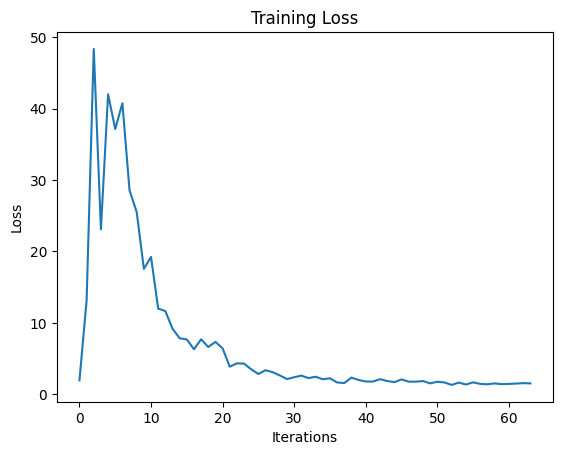

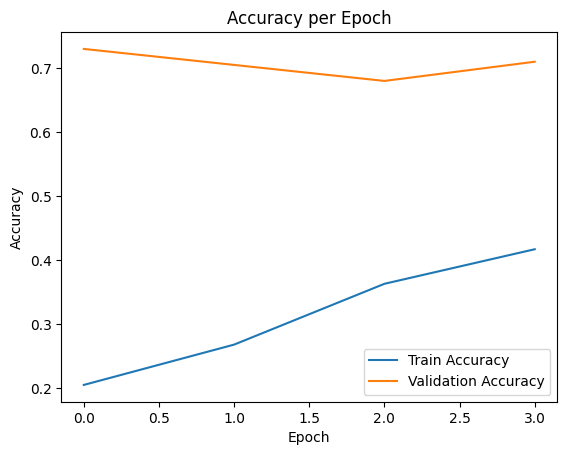

Final Training Accuracy: 0.4170
Best Validation Accuracy: 0.7300


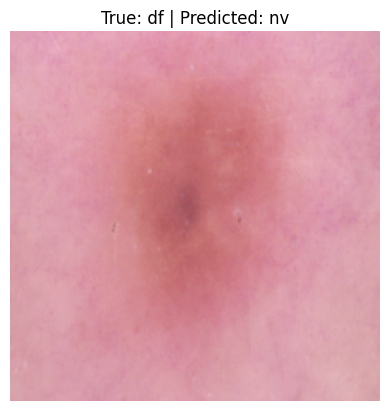

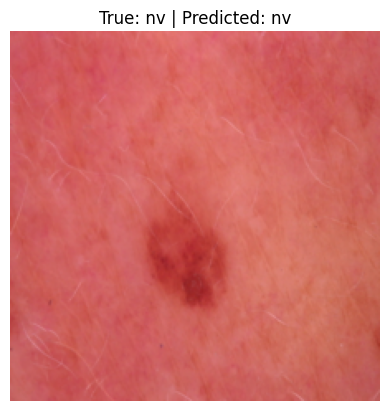

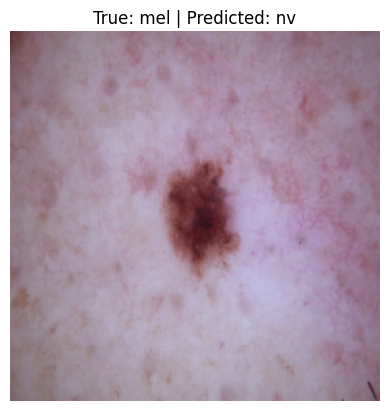

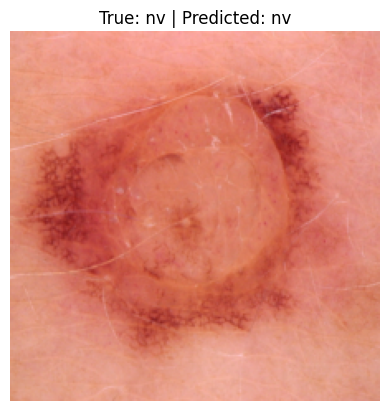

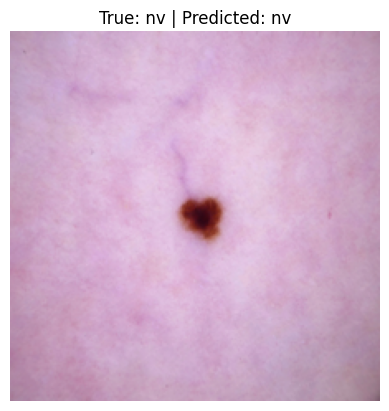

...

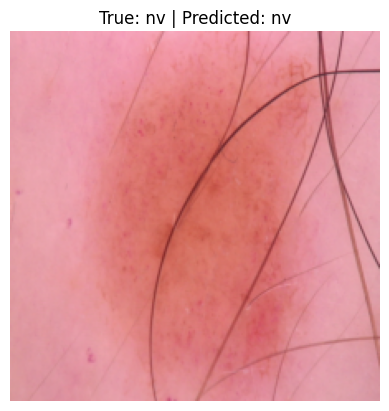

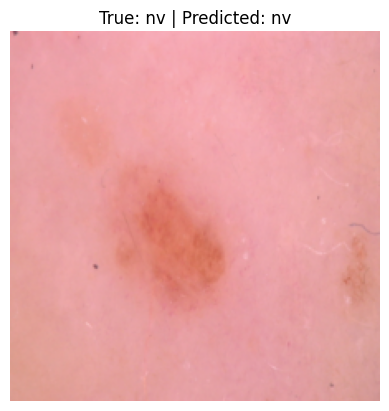

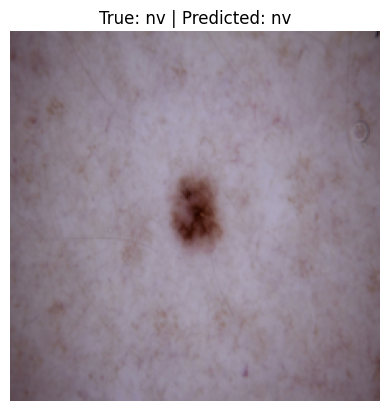

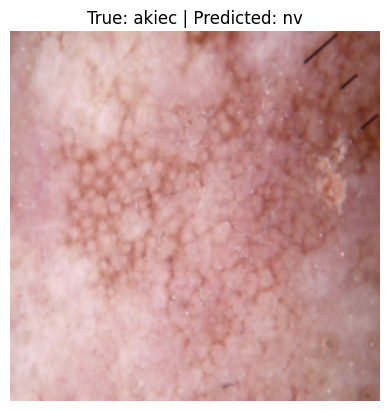

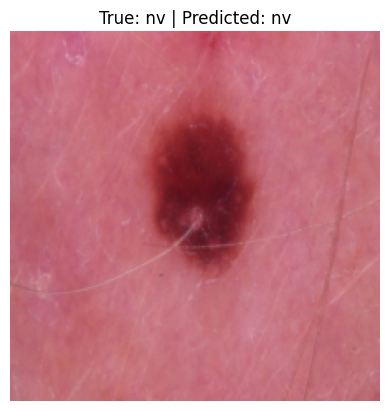

In [ ]:
from torch.utils.data import Subset
import random

random.seed(42)
torch.manual_seed(42)

# Original full dataset
train_dataset = torchvision.datasets.ImageFolder(train_dir,
                                                 transform=train_transform)
val_dataset = torchvision.datasets.ImageFolder(val_dir,
                                               transform=val_test_transform)


#Used 1000 images from training set and 200 images from validation set
train_indices = random.sample(range(len(train_dataset)),1000)
val_indices = random.sample(range(len(val_dataset)), 200)

train_subset = Subset(train_dataset, train_indices)
val_subset = Subset(val_dataset, val_indices)

# Loaders for subset
train_loader_small = torch.utils.data.DataLoader(train_subset, batch_size=64,
                                                 shuffle=True)
val_loader_small = torch.utils.data.DataLoader(val_subset, batch_size=64,
                                               shuffle=False)

model = EncoderDecoderCNN(num_classes=7).to(DEVICE)
print("here")
train(model, train_loader_small, val_loader_small, DEVICE, batch_size=64,
      num_epochs=25)
#train(model, train_loader_small, val_loader, DEVICE, batch_size=64, num_epochs=10)
class_names = val_dataset.classes  # or val_dataset.classes
import matplotlib.pyplot as plt

def show_predictions(model, data_loader, device, class_names, num_samples=5):
    model.eval()
    shown = 0

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs, labels = imgs.to(device), labels.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1)

            for i in range(len(imgs)):
                if shown >= num_samples:
                    return
                img = imgs[i].cpu().permute(1, 2, 0)
                img = img * torch.tensor([0.229, 0.224, 0.225]) +
                torch.tensor([0.485, 0.456, 0.406])  # unnormalize
                img = torch.clamp(img, 0, 1)

                plt.imshow(img)
                plt.title(
        f"True: {class_names[labels[i]]} | Predicted: {class_names[preds[i]]}")
                plt.axis('off')
                plt.show()
                shown += 1

show_predictions(model, val_loader_small, DEVICE, class_names, num_samples=14)



here
Epoch 1/25 | Loss: 19.7971 | Train Acc: 0.2242 | Val Acc: 0.5733
Epoch 2/25 | Loss: 2.1631 | Train Acc: 0.2708 | Val Acc: 0.6600
Epoch 3/25 | Loss: 1.6049 | Train Acc: 0.3933 | Val Acc: 0.6033
Epoch 4/25 | Loss: 1.4645 | Train Acc: 0.4267 | Val Acc: 0.6367
Epoch 5/25 | Loss: 1.4275 | Train Acc: 0.4500 | Val Acc: 0.6733
Epoch 6/25 | Loss: 1.4175 | Train Acc: 0.4492 | Val Acc: 0.6500
Epoch 7/25 | Loss: 1.3436 | Train Acc: 0.4708 | Val Acc: 0.6333
Epoch 8/25 | Loss: 1.2818 | Train Acc: 0.4967 | Val Acc: 0.6267
Early stopping triggered after 8 epochs.


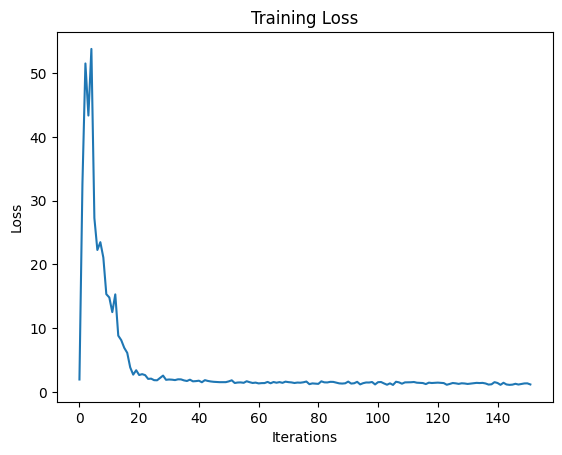

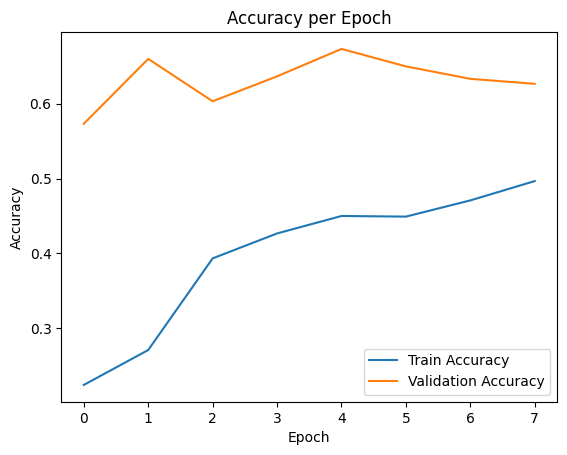

Final Training Accuracy: 0.4967
Best Validation Accuracy: 0.6733


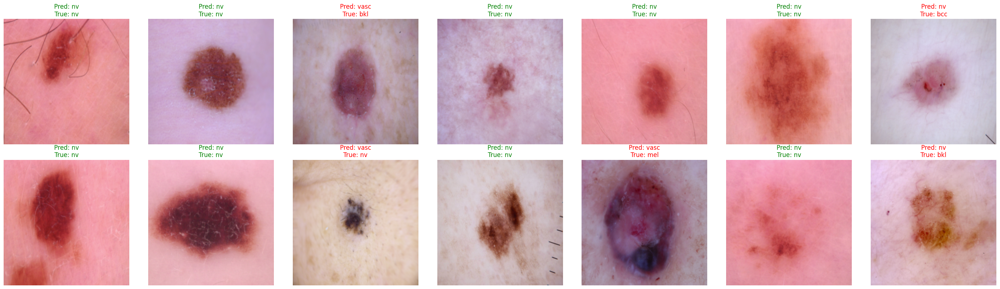

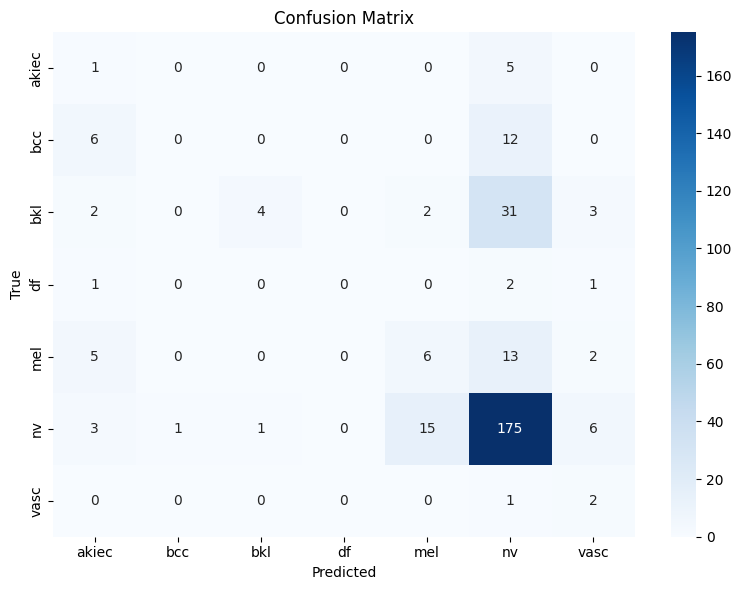

Accuracy: 0.6267
Precision (weighted): 0.6277
Recall (weighted): 0.6267
F1 Score (weighted): 0.582

Classification Report:

              precision    recall  f1-score   support

       akiec       0.06      0.17      0.08         6
         bcc       0.00      0.00      0.00        18
         bkl       0.80      0.10      0.17        42
          df       0.00      0.00      0.00         4
         mel       0.26      0.23      0.24        26
          nv       0.73      0.87      0.80       201
        vasc       0.14      0.67      0.24         3

    accuracy                           0.63       300
   macro avg       0.28      0.29      0.22       300
weighted avg       0.63      0.63      0.58       300



/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/m

In [ ]:
from torch.utils.data import Subset
import random

random.seed(42)
torch.manual_seed(42)

# Original full dataset
train_dataset = torchvision.datasets.ImageFolder(train_dir,
                                                 transform=train_transform)
val_dataset = torchvision.datasets.ImageFolder(val_dir,
                                               transform=val_test_transform)

train_indices = random.sample(range(len(train_dataset)),1200)
val_indices = random.sample(range(len(val_dataset)), 300)

train_subset = Subset(train_dataset, train_indices)
val_subset = Subset(val_dataset, val_indices)


# Loaders for subset
train_loader_small = torch.utils.data.DataLoader(train_subset, batch_size=64,
                                                 shuffle=True)
val_loader_small = torch.utils.data.DataLoader(val_subset, batch_size=64,
                                               shuffle=False)

model = EncoderDecoderCNN(num_classes=7).to(DEVICE)
print("here")
train(model, train_loader_small, val_loader_small, DEVICE, batch_size=64,
      num_epochs=25)
#train(model, train_loader_small, val_loader, DEVICE, batch_size=64, num_epochs=10)
class_names = val_dataset.classes  # or val_dataset.classes
import matplotlib.pyplot as plt

import matplotlib.pyplot as plt
import torch
import torchvision

def show_predictions(model, dataloader, device, class_names, num_samples=6):
    model.eval()
    model.to(device)

    images_shown = 0
    fig_cols = 7 # was originally 3
    fig_rows = (num_samples + fig_cols - 1) // fig_cols  # ceiling division

    plt.figure(figsize=(fig_cols * 4, fig_rows * 4))

    with torch.no_grad():
        for imgs, labels in dataloader:
            imgs = imgs.to(device)
            labels = labels.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1)

            for i in range(imgs.size(0)):
                if images_shown >= num_samples:
                    break

                img = imgs[i].cpu()
                label = labels[i].item()
                pred = preds[i].item()

                plt.subplot(fig_rows, fig_cols, images_shown + 1)
                # Undo normalization
                img = img * torch.tensor([0.229, 0.224, 0.225]).view(3,1,1) +
                torch.tensor([0.485, 0.456, 0.406]).view(3,1,1)
                img = torch.clamp(img, 0, 1)

                plt.imshow(img.permute(1, 2, 0).numpy())
                plt.axis('off')

                # Color-coded prediction
                color = 'green' if pred == label else 'red'
                plt.title(
        f"Pred: {class_names[pred]}\nTrue: {class_names[label]}", color=color)

                images_shown += 1
            if images_shown >= num_samples:
                break

    plt.tight_layout()
    plt.show()

class_names = ['akiec', 'bcc', 'bkl', 'df', 'mel', 'nv', 'vasc']
# 7 skin lesion classes
#show_predictions(model, val_loader_small, DEVICE, class_names, num_samples=6)
show_predictions(model, val_loader_small, DEVICE, class_names, num_samples=14)

import torch
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import numpy as np

def plot_confusion_matrix(model, data_loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.numpy())

    cm = confusion_matrix(all_labels, all_preds)

    plt.figure(figsize=(8, 6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=class_names, yticklabels=class_names)
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title("Confusion Matrix")
    plt.tight_layout()
    plt.show()

plot_confusion_matrix(model, val_loader_small, DEVICE, class_names)

from sklearn.metrics import classification_report, accuracy_score, f1_score,
precision_score, recall_score

def evaluate_metrics(model, data_loader, device, class_names):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for imgs, labels in data_loader:
            imgs = imgs.to(device)
            outputs = model(imgs)
            preds = outputs.argmax(dim=1).cpu().numpy()
            all_preds.extend(preds)
            all_labels.extend(labels.cpu().numpy())

    # Overall Accuracy
    acc = accuracy_score(all_labels, all_preds)
    f1 = f1_score(all_labels, all_preds, average='weighted')
    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')

    print("Accuracy:", round(acc, 4))
    print("Precision (weighted):", round(precision, 4))
    print("Recall (weighted):", round(recall, 4))
    print("F1 Score (weighted):", round(f1, 4))

    print("\nClassification Report:\n")
    print(classification_report(all_labels, all_preds, target_names=class_names))

evaluate_metrics(model, val_loader_small, DEVICE, class_names)
#show_predictions(model, val_loader_small, DEVICE, class_names, num_samples=14)



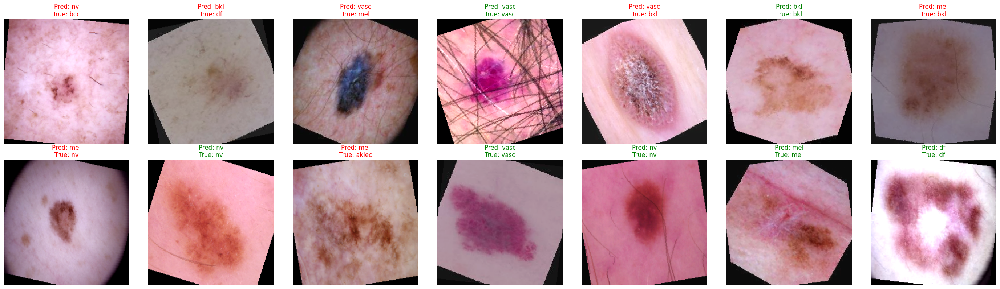

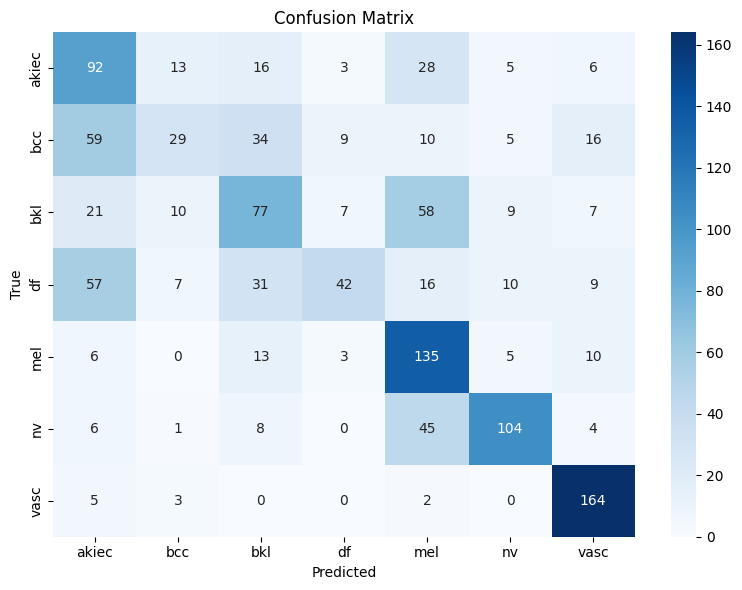

Accuracy: 0.53
Precision (weighted): 0.5598
Recall (weighted): 0.53
F1 Score (weighted): 0.5025

Classification Report:

              precision    recall  f1-score   support

       akiec       0.39      0.63      0.48       163
         bcc       0.51      0.14      0.21       162
         bkl       0.40      0.38      0.39       189
          df       0.67      0.25      0.36       172
         mel       0.45      0.80      0.58       172
          nv       0.77      0.60      0.68       168
        vasc       0.73      0.91      0.81       174

    accuracy                           0.53      1200
   macro avg       0.56      0.53      0.50      1200
weighted avg       0.56      0.53      0.50      1200



In [ ]:
show_predictions(model, train_loader_small, DEVICE, class_names, num_samples=14)
plot_confusion_matrix(model, train_loader_small, DEVICE, class_names)
evaluate_metrics(model, train_loader_small, DEVICE, class_names)

**Problem:** We encountered a problem where one of the images were corrupted.
**Solution:** Find corrupted image and delete it

In [ ]:
import os

# Get the path of the image from the DataFrame that caused the error
image_id_in_error = 'ISIC_0032725'
error_row = df[df['image_id'] == image_id_in_error]

if not error_row.empty:
    image_path_in_df = error_row['image_path'].iloc[0]
    print(f"Path in DataFrame for {image_id_in_error}: {image_path_in_df}")
    print(f"Does the file exist at this path? {os.path.exists(image_path_in_df)}")
else:
    print(f"Image ID {image_id_in_error} not found in the DataFrame.")

# List files in the target directory
target_bkl_dir = "/content/drive/MyDrive/APS360 Final Project/Data/train/bkl"
print(f"\nListing files in {target_bkl_dir}:")
try:
    for file in os.listdir(target_bkl_dir):
        if image_id_in_error in file:
            print(f"Found file in target directory: {file}")
except FileNotFoundError:
    print(f"Target directory not found: {target_bkl_dir}")

Path in DataFrame for ISIC_0032725: skin_cancer_data/ham10000_images_part_2/ISIC_0032725.jpg
Does the file exist at this path? True

Listing files in /content/drive/MyDrive/APS360 Final Project/Data/train/bkl:
Found file in target directory: ISIC_0032725.jpg
Found file in target directory: augmented_3992_ISIC_0032725.jpg
Found file in target directory: augmented_1813_ISIC_0032725.jpg
Found file in target directory: augmented_2053_ISIC_0032725.jpg
Found file in target directory: augmented_1362_ISIC_0032725.jpg
Found file in target directory: augmented_1514_ISIC_0032725.jpg
Found file in target directory: augmented_336_ISIC_0032725.jpg


In [ ]:
import os
from PIL import Image, UnidentifiedImageError
from tqdm import tqdm

def find_and_report_bad_images(directory):
    bad_images = []
    print(f"Checking images in {directory}...")
    for root, _, files in os.walk(directory):
        for file in tqdm(files):
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                img_path = os.path.join(root, file)
                try:
                    # Attempt to open and verify the image
                    img = Image.open(img_path)
                    img.verify() # Verify the image integrity
                    img.close() # Close the image file
                except (IOError, SyntaxError, UnidentifiedImageError) as e:
                    # Catch errors related to image opening or identification
                    bad_images.append((img_path, e))
                except Exception as e:
                    # Catch any other unexpected errors
                    bad_images.append((img_path, f"Unexpected error: {e}"))

    return bad_images

# Define your dataset directories
train_dir = "/content/drive/MyDrive/APS360 Final Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Final Project/Data/val"
test_dir = "/content/drive/MyDrive/APS360 Final Project/Data/test"


# Check the training, validation, and test directories
bad_train_images = find_and_report_bad_images(train_dir)
bad_val_images = find_and_report_bad_images(val_dir)
bad_test_images = find_and_report_bad_images(test_dir)

print("\n--- Bad Images Summary ---")
if bad_train_images:
    print(f"Found {len(bad_train_images)} bad images in the training set:")
    for img_path, e in bad_train_images:
        print(f"- {img_path}: {e}")
else:
    print("No bad images found in the training set.")

if bad_val_images:
    print(f"\nFound {len(bad_val_images)} bad images in the validation set:")
    for img_path, e in bad_val_images:
        print(f"- {img_path}: {e}")
else:
    print("\nNo bad images found in the validation set.")

if bad_test_images:
    print(f"\nFound {len(bad_test_images)} bad images in the test set:")
    for img_path, e in bad_test_images:
        print(f"- {img_path}: {e}")
else:
    print("\nNo bad images found in the test set.")

# After running this code, you can manually inspect the reported image paths
# and decide whether to remove or replace the problematic files.

Checking images in /content/drive/MyDrive/APS360 Final Project/Data/train...


0it [00:00, ?it/s]
100%|██████████| 6000/6000 [02:28<00:00, 40.44it/s] 


Checking images in /content/drive/MyDrive/APS360 Final Project/Data/val...


0it [00:00, ?it/s]
100%|██████████| 49/49 [00:20<00:00,  2.36it/s]


Checking images in /content/drive/MyDrive/APS360 Final Project/Data/test...


0it [00:00, ?it/s]
100%|██████████| 17/17 [00:09<00:00,  1.85it/s]


--- Bad Images Summary ---
Found 1 bad images in the training set:
- /content/drive/MyDrive/APS360 Final Project/Data/train/bkl/ISIC_0032725.jpg: cannot identify image file '/content/drive/MyDrive/APS360 Final Project/Data/train/bkl/ISIC_0032725.jpg'

No bad images found in the validation set.

No bad images found in the test set.


Deleted the corrupted image, run code again to see if there are no more corrupted images

In [ ]:
import os
from PIL import Image, UnidentifiedImageError
from tqdm import tqdm

def find_and_report_bad_images(directory):
    bad_images = []
    print(f"Checking images in {directory}...")
    for root, _, files in os.walk(directory):
        for file in tqdm(files):
            if file.lower().endswith(('.png', '.jpg', '.jpeg', '.bmp', '.gif')):
                img_path = os.path.join(root, file)
                try:
                    # Attempt to open and verify the image
                    img = Image.open(img_path)
                    img.verify() # Verify the image integrity
                    img.close() # Close the image file
                except (IOError, SyntaxError, UnidentifiedImageError) as e:
                    # Catch errors related to image opening or identification
                    bad_images.append((img_path, e))
                except Exception as e:
                    # Catch any other unexpected errors
                    bad_images.append((img_path, f"Unexpected error: {e}"))

    return bad_images

# Define your dataset directories
train_dir = "/content/drive/MyDrive/APS360 Final Project/Data/train"
val_dir = "/content/drive/MyDrive/APS360 Final Project/Data/val"
test_dir = "/content/drive/MyDrive/APS360 Final Project/Data/test"


# Check the training, validation, and test directories
bad_train_images = find_and_report_bad_images(train_dir)
bad_val_images = find_and_report_bad_images(val_dir)
bad_test_images = find_and_report_bad_images(test_dir)

print("\n--- Bad Images Summary ---")
if bad_train_images:
    print(f"Found {len(bad_train_images)} bad images in the training set:")
    for img_path, e in bad_train_images:
        print(f"- {img_path}: {e}")
else:
    print("No bad images found in the training set.")

if bad_val_images:
    print(f"\nFound {len(bad_val_images)} bad images in the validation set:")
    for img_path, e in bad_val_images:
        print(f"- {img_path}: {e}")
else:
    print("\nNo bad images found in the validation set.")

if bad_test_images:
    print(f"\nFound {len(bad_test_images)} bad images in the test set:")
    for img_path, e in bad_test_images:
        print(f"- {img_path}: {e}")
else:
    print("\nNo bad images found in the test set.")

# After running this code, you can manually inspect the reported image paths
# and decide whether to remove or replace the problematic files.

Checking images in /content/drive/MyDrive/APS360 Final Project/Data/train...


0it [00:00, ?it/s]
100%|██████████| 6000/6000 [01:02<00:00, 95.61it/s] 


Checking images in /content/drive/MyDrive/APS360 Final Project/Data/val...


0it [00:00, ?it/s]
100%|██████████| 49/49 [00:00<00:00, 393.68it/s]


Checking images in /content/drive/MyDrive/APS360 Final Project/Data/test...


0it [00:00, ?it/s]
100%|██████████| 17/17 [00:00<00:00, 460.75it/s]


--- Bad Images Summary ---
No bad images found in the training set.

No bad images found in the validation set.

No bad images found in the test set.
